In [2]:
!nvidia-smi

Sun Mar 10 12:55:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install Libraries 

In [3]:
# Install the required libraries
#SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git
#Transformers
!pip install -q git+https://github.com/huggingface/transformers.git
#Datasets to prepare data and monai if you want to use special loss functions
!pip install datasets
!pip install -q monai

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-1qqa0cmo
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-1qqa0cmo
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done


## Load dataset

In [4]:
import numpy as np
import os
import cv2

def load_images_and_masks(images_path, masks_path, target_size=(256, 256)):
    # Load images
    images = []
    for file in sorted(os.listdir(images_path)):
        image = cv2.imread(os.path.join(images_path, file))
        resized_image = cv2.resize(image, target_size)
        images.append(resized_image)

    # Load, convert to grayscale, and resize masks
    masks = []
    for file in sorted(os.listdir(masks_path)):
        mask = cv2.imread(os.path.join(masks_path, file), cv2.IMREAD_GRAYSCALE)
        resized_mask = cv2.resize(mask, target_size)
        masks.append(resized_mask)

    return np.array(images), np.array(masks)


images_dir = "/kaggle/input/wheat-segmentation-dataset/train/images"
masks_dir = "/kaggle/input/wheat-segmentation-dataset/train/masks"

images, masks = load_images_and_masks(images_dir, masks_dir, target_size=(256, 256))

In [5]:
images.shape, masks.shape

((1000, 256, 256, 3), (1000, 256, 256))

In [6]:
# Create a list to store the indices of non-empty masks
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]

# Filter the image and mask arrays to keep only the non-empty pairs
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]
print("Image shape:", filtered_images.shape)
print("Mask shape:", filtered_masks.shape)

Image shape: (1000, 256, 256, 3)
Mask shape: (1000, 256, 256)


### Creating a Dataset from Images and Masks

The following Python code snippet demonstrates the creation of a dataset from images and corresponding masks using the `datasets.Dataset` class. The images and masks are represented as lists of `PIL.Image.Image` objects, created from NumPy arrays.


In [7]:
from datasets import Dataset
from PIL import Image

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict) 

In [8]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 1000
})

### Visualizing Example Image and Mask

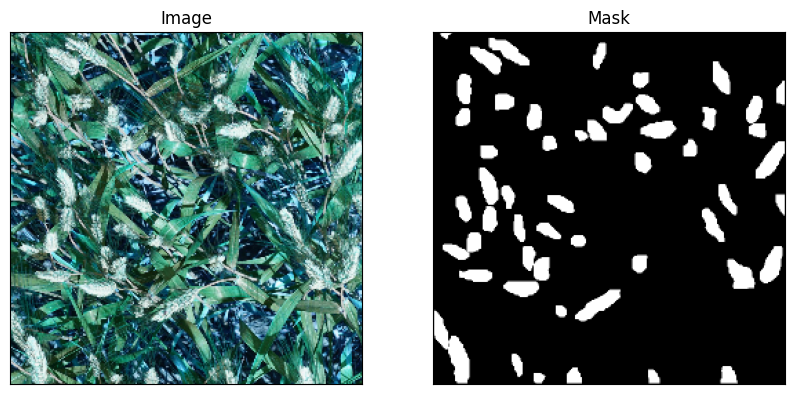

In [9]:
import random
import matplotlib.pyplot as plt

idx = random.randint(0, filtered_images.shape[0]-1)
example_image = dataset[idx]["image"]
example_mask = dataset[idx]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

### Bounding Box Extraction from Mask

This function, `get_bounding_box`, takes a binary ground truth mask as input and computes the bounding box coordinates. Additionally, a perturbation is applied to the bounding box, introducing variability. The resulting bounding box is represented as `[x_min, y_min, x_max, y_max]`.

In [10]:
#Get bounding boxes from mask.
def get_bounding_box(ground_truth_map):
  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_map > 0)
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)
  # add perturbation to bounding box coordinates
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]

  return bbox

### SAM Dataset for Image Segmentation

The `SAMDataset` class, short for Segment Anything Model Dataset, is a custom dataset class derived from `torch.utils.data.Dataset`. It is designed to facilitate input images and masks for the Segment Anything Model.

#### Class Overview:
- **Initialization**: Takes a dataset and a processor as input.
- **Methods**:
  - `__len__(self)`: Overrides the `__len__` method to return the length of the underlying dataset.
  - `__getitem__(self, idx)`: Overrides the `__getitem__` method to fetch and process items from the dataset. Extracts an image and its ground truth mask, generates a bounding box prompt, and prepares the input for the SAM model.

In [11]:
from torch.utils.data import Dataset

class SAMDataset(Dataset):
  """
  This class is used to create a dataset that serves input images and masks.
  It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
  """
  def __init__(self, dataset, processor):
    self.dataset = dataset
    self.processor = processor

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    image = item["image"]
    ground_truth_mask = np.array(item["label"])

    # get bounding box prompt
    prompt = get_bounding_box(ground_truth_mask)

    # prepare image and prompt for the model
    inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

    # remove batch dimension which the processor adds by default
    inputs = {k:v.squeeze(0) for k,v in inputs.items()}

    # add ground truth segmentation
    inputs["ground_truth_mask"] = ground_truth_mask

    return inputs

### SAM Dataset Initialization and Example

- Initialize the SAM processor using the `SamProcessor` from the `transformers` library, pretrained on "facebook/sam-vit-large".
- Create an instance of the SAMDataset by passing a dataset and the initialized processor.


In [12]:
# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-large")

# Create an instance of the SAMDataset
train_dataset = SAMDataset(dataset=dataset, processor=processor)

2024-03-10 12:58:29.975296: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-10 12:58:29.975411: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-10 12:58:30.138926: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [13]:
example = train_dataset[0]
for k,v in example.items():
  print(k,v.shape)

pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask (256, 256)


### DataLoader and Batch Initialization
- Create a DataLoader for training with a batch size of 4, enabling shuffling, and not dropping the last incomplete batch.


In [14]:
# Create a DataLoader instance for the training dataset
from torch.utils.data import DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, drop_last=False)
train_dataloader

In [15]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  print(k,v.shape)

pixel_values torch.Size([4, 3, 1024, 1024])
original_sizes torch.Size([4, 2])
reshaped_input_sizes torch.Size([4, 2])
input_boxes torch.Size([4, 1, 4])
ground_truth_mask torch.Size([4, 256, 256])


In [16]:
batch["ground_truth_mask"].shape

torch.Size([4, 256, 256])

### Model, Optimizer, and Loss Initialization

In [17]:
# Load the model
from transformers import SamModel
model = SamModel.from_pretrained("facebook/sam-vit-large")

# make sure we only compute gradients for mask decoder
for name, param in model.named_parameters():
  if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
    param.requires_grad_(False)

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.25G [00:00<?, ?B/s]

In [18]:
from torch.optim import Adam
import monai

# Initialize the optimizer and the loss function
optimizer = Adam(model.mask_decoder.parameters(), lr=1e-5, weight_decay=0)
#Try DiceFocalLoss, FocalLoss, DiceCELoss
seg_loss = monai.losses.FocalLoss(reduction='mean')

## Training

In [19]:
from tqdm import tqdm
from statistics import mean
import torch
from torch.nn.functional import threshold, normalize

#Training loop
num_epochs = 5

device = "cuda:0" if torch.cuda.is_available() else "cpu"
model = torch.nn.DataParallel(model, device_ids = [0,1]).to(device)


# device = "cuda" if torch.cuda.is_available() else "cpu"
# model.to(device)

model.train()
for epoch in range(num_epochs):
    epoch_losses = []
    for batch in tqdm(train_dataloader):
      # forward pass
      outputs = model(pixel_values=batch["pixel_values"].to(device),
                      input_boxes=batch["input_boxes"].to(device),
                      multimask_output=False)

      # compute loss
      predicted_masks = outputs.pred_masks.squeeze(1)
      ground_truth_masks = batch["ground_truth_mask"].float().to(device)
      loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))

      # backward pass (compute gradients of parameters w.r.t. loss)
      optimizer.zero_grad()
      loss.backward()

      # optimize
      optimizer.step()
      epoch_losses.append(loss.item())

    print(f'EPOCH: {epoch}')
    print(f'Mean loss: {mean(epoch_losses)}')

100%|██████████| 250/250 [11:08<00:00,  2.67s/it]


EPOCH: 0
Mean loss: 0.4477219997048378


100%|██████████| 250/250 [11:07<00:00,  2.67s/it]


EPOCH: 1
Mean loss: 0.18637982988357543


100%|██████████| 250/250 [11:10<00:00,  2.68s/it]


EPOCH: 2
Mean loss: 0.1688515763580799


100%|██████████| 250/250 [11:12<00:00,  2.69s/it]


EPOCH: 3
Mean loss: 0.16249803245067596


100%|██████████| 250/250 [11:10<00:00,  2.68s/it]

EPOCH: 4
Mean loss: 0.15755217829346657


### Save model

In [20]:
# Save the model's state dictionary to a file
torch.save(model.state_dict(), "/kaggle/working/model.pth")

## Inference 

In [21]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

In [37]:
from transformers import SamConfig, SamModel, SamProcessor

# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-large")
processor = SamProcessor.from_pretrained("facebook/sam-vit-large")

# Create an instance of the model architecture with the loaded configuration
my_model = SamModel(config=model_config)

# Load the state dictionary into the model, handling 'module.' prefix if necessary
state_dict = torch.load("/kaggle/working/model.pth", map_location=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'))

# If the model was trained using DataParallel, handle 'module.' prefix
if all(key.startswith('module.') for key in state_dict.keys()):
    # Remove 'module.' prefix from state_dict keys
    state_dict = {k[len('module.'):]: v for k, v in state_dict.items()}

my_model.load_state_dict(state_dict)

# Move the model to the appropriate device (e.g., GPU)
device = "cuda:0" if torch.cuda.is_available() else "cpu"
my_model = my_model.to(device)

### training example

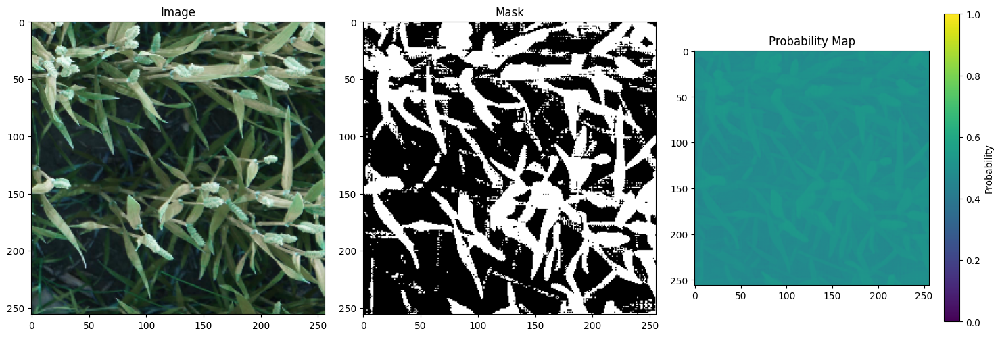

In [64]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image (hard mask) on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the third image (probability map) on the right
axes[2].imshow(medsam_seg_prob, cmap='viridis', vmin=0, vmax=1)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Add colorbar for the probability map
cbar = fig.colorbar(axes[2].imshow(medsam_seg_prob, cmap='viridis', vmin=0, vmax=1), ax=axes[2])
cbar.set_label('Probability')

# Adjust layout for better visualization
plt.tight_layout()

# Display the images side by side
plt.show()

### test images 

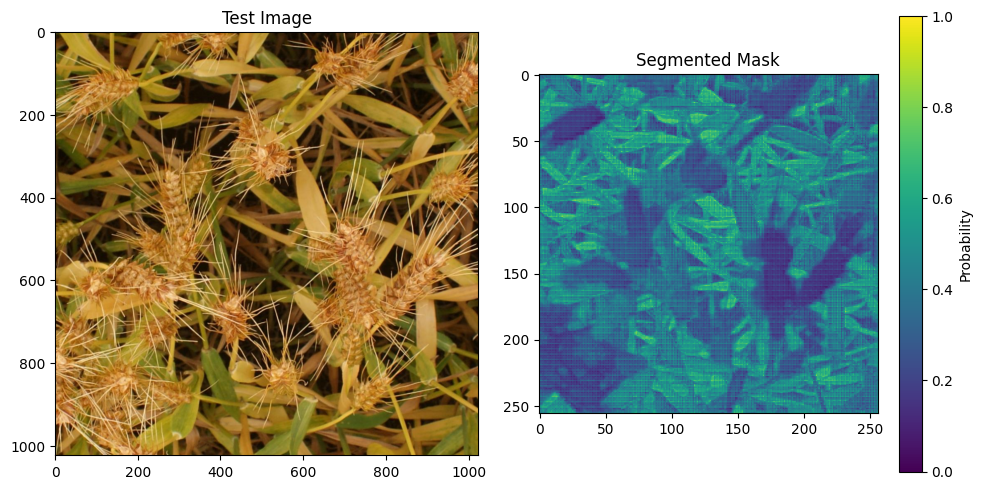

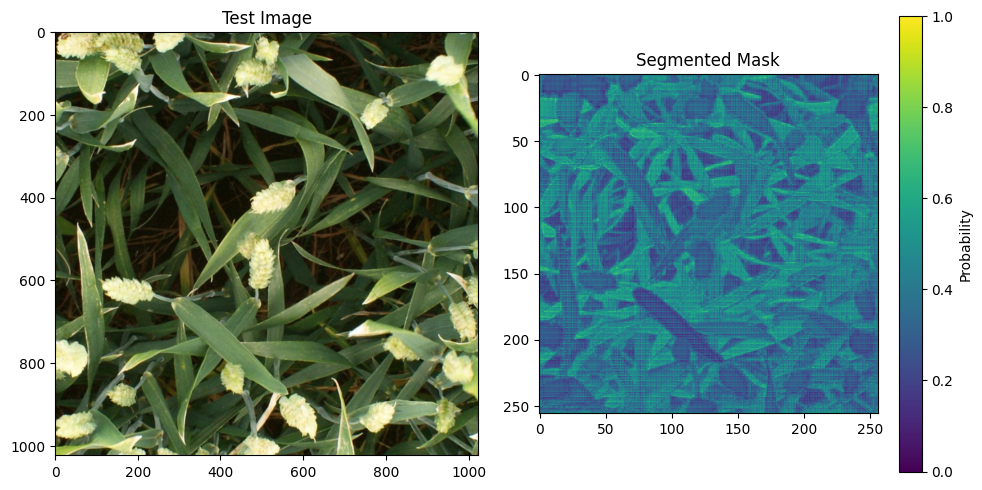

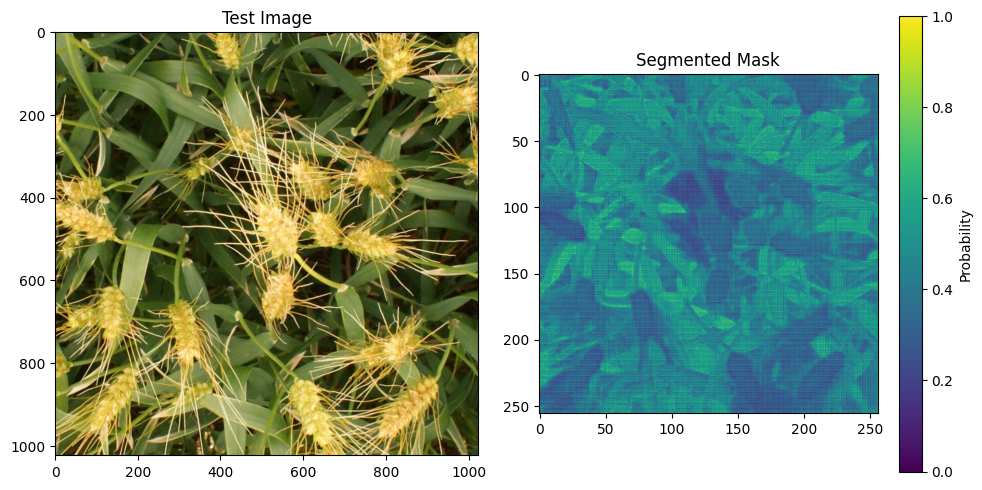

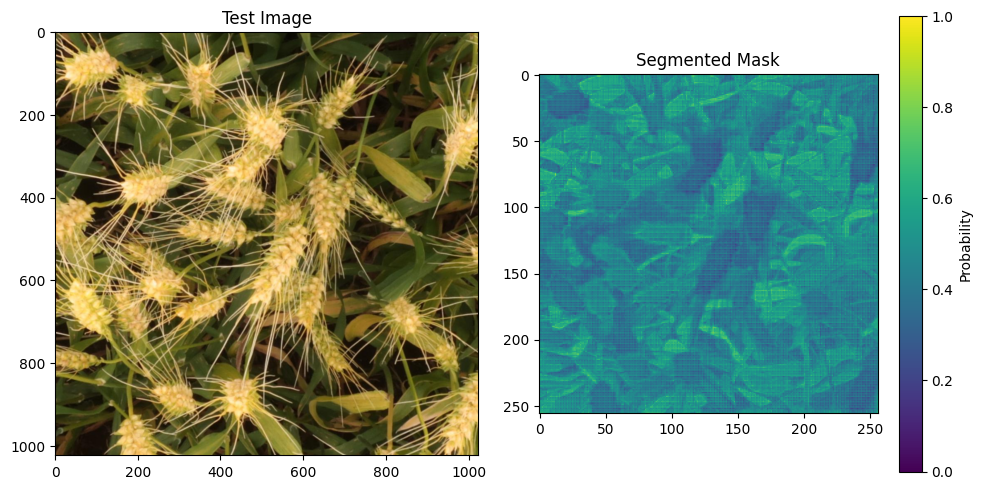

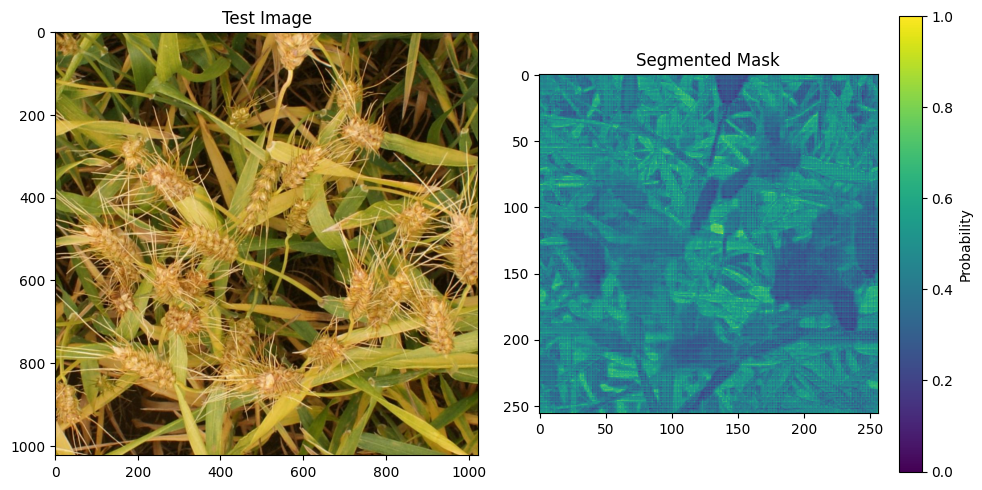

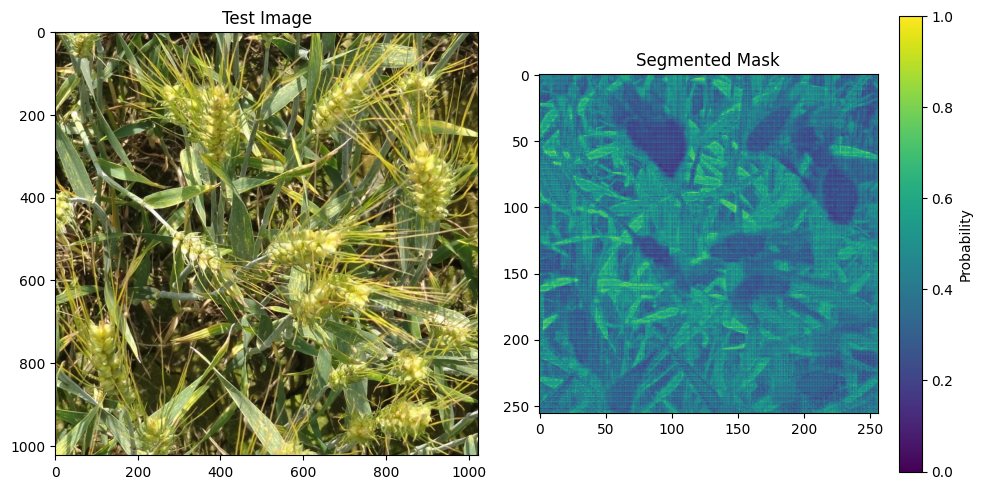

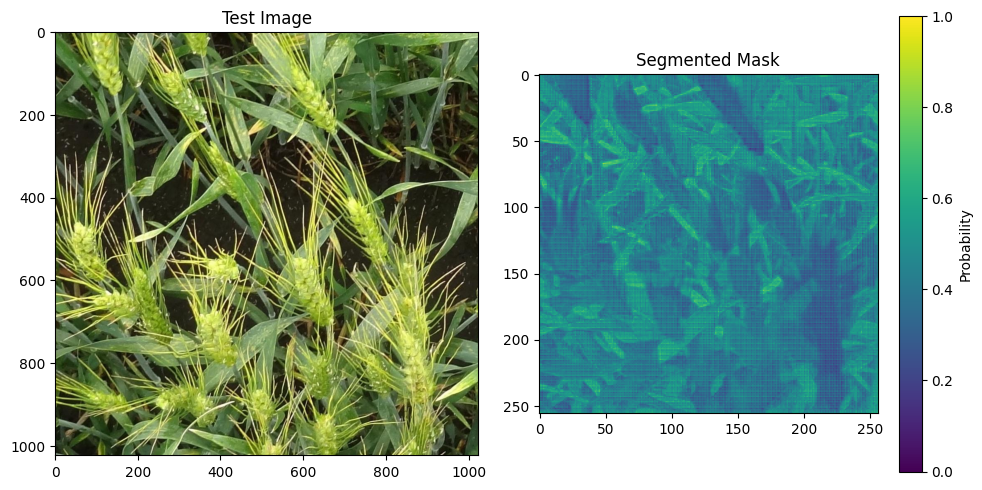

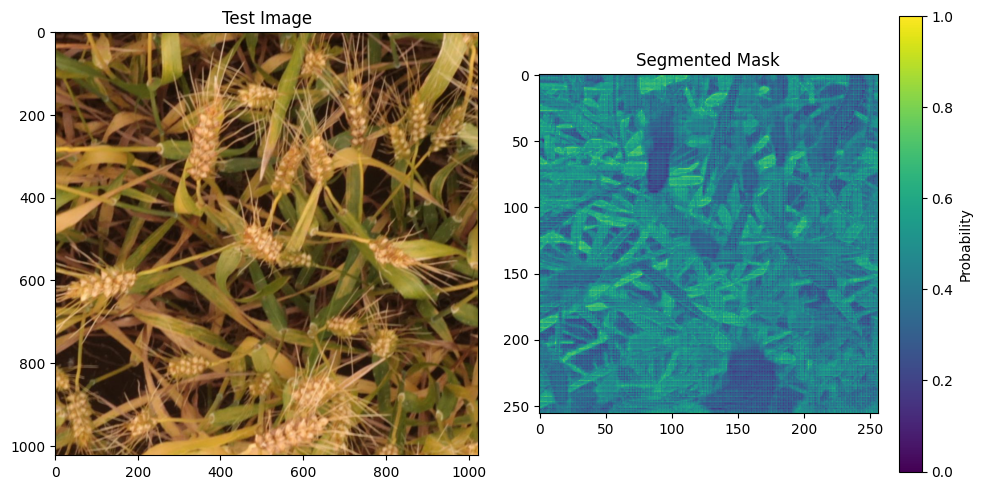

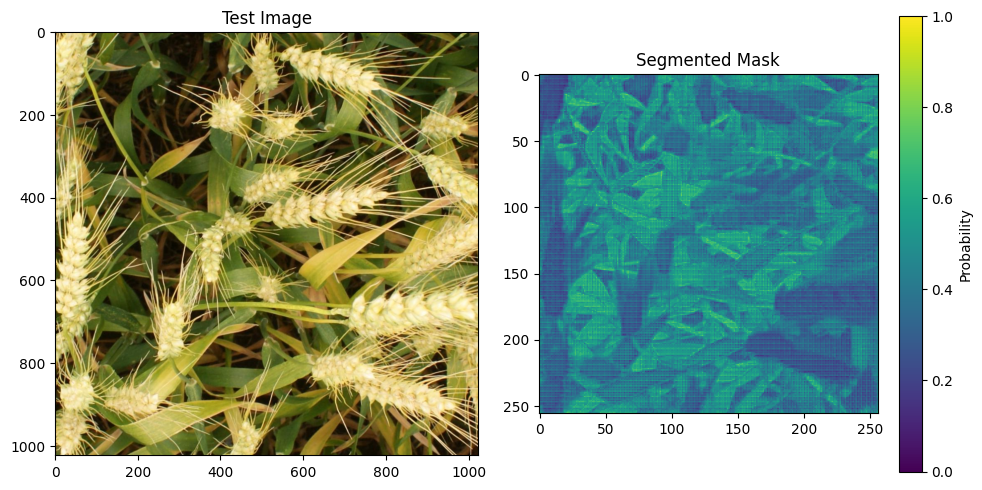

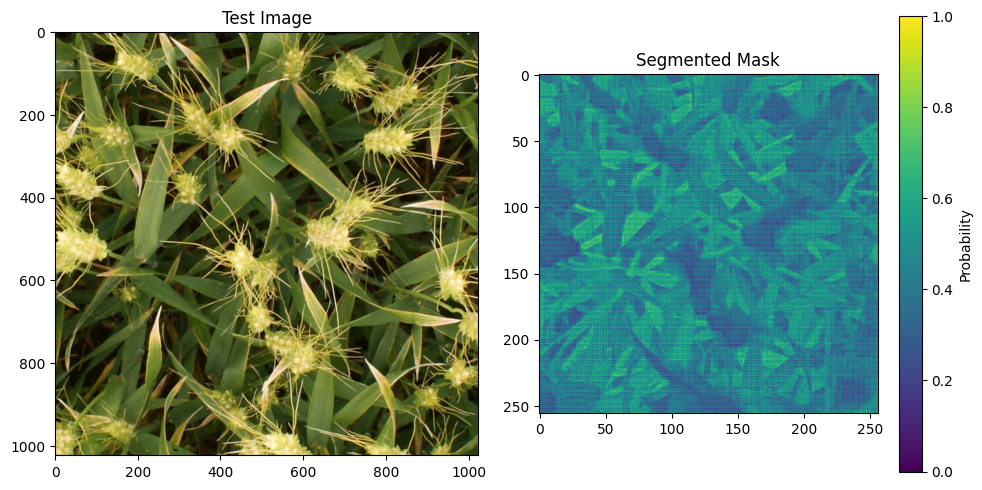

In [66]:
import os
from PIL import Image

# Assuming 'test_images_folder' is the path to your test images folder
test_images_folder = "/kaggle/input/wheat-segmentation-dataset/test"

# Get a list of file names in the folder
test_image_files = os.listdir(test_images_folder)

# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-large")
processor = SamProcessor.from_pretrained("facebook/sam-vit-large")

# Create an instance of the model architecture with the loaded configuration
my_model = SamModel(config=model_config)

# Load the state dictionary into the model, handling 'module.' prefix if necessary
state_dict = torch.load("/kaggle/working/model.pth", map_location=torch.device('cuda:0' if torch.cuda.is_available() else 'cpu'))

# If the model was trained using DataParallel, handle 'module.' prefix
if all(key.startswith('module.') for key in state_dict.keys()):
    # Remove 'module.' prefix from state_dict keys
    state_dict = {k[len('module.'):]: v for k, v in state_dict.items()}

my_model.load_state_dict(state_dict)

# Move the model to the appropriate device (e.g., GPU)
device = "cuda:0" if torch.cuda.is_available() else "cpu"
my_model = my_model.to(device)

for test_image_file in test_image_files:
    # Load the image using PIL
    test_image_path = os.path.join(test_images_folder, test_image_file)
    test_image = Image.open(test_image_path)

    # Prepare image for the model
    inputs = processor(test_image, return_tensors="pt")

    # Move the input tensor to the GPU if it's not already there
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Perform inference
    my_model.eval()

    with torch.no_grad():
        outputs = my_model(**inputs, multimask_output=False)

    # Apply sigmoid and convert soft mask to hard mask
    medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
    medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
    medsam_seg = (medsam_seg_prob > 0.7).astype(np.uint8)

    # Display the inference results for the current test image
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(np.array(test_image), cmap='gray')
    axes[0].set_title("Test Image")

    im = axes[1].imshow(medsam_seg, cmap='gray')
    axes[1].set_title("Segmented Mask")

    # Add colorbar for the probability map
    cbar = fig.colorbar(axes[1].imshow(medsam_seg_prob, cmap='viridis', vmin=0, vmax=1), ax=axes[1])
    cbar.set_label('Probability')

    plt.tight_layout()
    plt.show()
